In [34]:
require(candisc)

Loading required package: candisc
Loading required package: car
Loading required package: heplots

Attaching package: ‘candisc’

Следующий объект скрыт от ‘package:stats’:

    cancor



# Канонический корреляяционный анализ

Задача: множественная регрессия (предсказать многомерные закоррелированные значения по многомерным закоррелированным переменным).

Данные: [предоставленная компанией Winton для соревнования](https://www.kaggle.com/c/the-winton-stock-market-challenge/data) информация о стоимости ценных бумаг (ЦБ) в течение 5-дневных промежутков времени. Про каждую ЦБ известен её доход за день $D-2$, $D-1$ и 120 доходов за минуты в течение дня $D$. Ещё 60 поминутных доходов в течение дня $D$ и доходы за дни $D+1$, $D+2$ известны для тренировочного набора данных, и их необходимо предсказать. Предоставленная иллюстрация не вполне совпадает с этим описанием, но в целом проясняет происходящее:

![Иллюстрация временных срезов](presentation.jpg)

Также для некоторых наблюдений предоставлены значения нескольких из 25 признаков, происхождение которых не объясняется. Мы не будем учитывать их в анализе.

Мы используем канонический корреляционный анализ для того, чтобы понять, существуют ли какие-либо значимые связи между группами известных и предсказываемых переменных.

In [1]:
data.big <- read.csv("train.csv", nrows=10000)

In [49]:
names(data.big) <- gsub("_", "", names(data.big))  # to not disturb latex converter
head(data.big)

,Id,Feature1,Feature2,Feature3,Feature4,Feature5,Feature6,Feature7,Feature8,Feature9,ellip.h,Ret175,Ret176,Ret177,Ret178,Ret179,Ret180,RetPlusOne,RetPlusTwo,WeightIntraday,WeightDaily
1,1,NA,NA,NA,NA,8,NA,75751,0.2254,11,⋯,-0.002688161,0.002246448,-0.0008384789,-0.0006953224,2.881868e-06,-0.00197373,-0.01951203,0.02884636,1251508,1564385
2,2,NA,NA,NA,NA,3,0.3888963,17369,0.0166,13,⋯,-0.0001288066,0.0001231983,0.0002479729,3.315418e-07,3.43429e-06,2.660238e-05,-0.00293887,-0.01025321,1733950,2167438
3,3,NA,-0.6967269,0.7395907,-0.1679282,9,0.4719467,8277,0.365,9,⋯,-0.00052446,-0.0003942209,0.00011621,0.0005322557,0.0002742008,0.0007836977,-0.02479127,0.01571074,1529197,1911497
4,4,NA,-0.6943497,1.568248,0.4790731,5,0.1206529,22508,0.2654,13,⋯,0.0003459796,-8.969682e-05,0.0002883115,-0.0001281102,7.438499e-05,0.0003408948,-0.005679629,-0.002190458,1711569,2139462
5,5,6,-1.736489,2.765531,1.24528,7,4.866985,22423,0.2138,13,⋯,-0.001234938,2.723557e-05,0.002449409,8.619882e-06,0.001208671,-4.149987e-06,0.03610375,-0.0265516,1267270,1584088
6,6,NA,NA,-0.6805151,NA,1,0.2270336,24099,0.2064,8,⋯,0.0002424093,0.00141151,0.001879851,-0.0009458593,0.0004713874,0.001192878,0.03109753,-0.006550781,1431110,1788888


In [55]:
data <- data.big[c('RetMinusTwo', 'RetMinusOne', 'RetPlusOne', 'RetPlusTwo')]

In [56]:
write.csv(data, "cutted_winton_data.csv")

In [51]:
part1 <- c('RetPlusOne', 'RetPlusTwo')
part2 <- c("RetMinusOne", "RetMinusTwo")
cc <- cancor(data[part1], data[part2])

In [52]:
print(cc)


Canonical correlation analysis of:
	 2   X  variables:  RetPlusOne, RetPlusTwo 
  with	 2   Y  variables:  RetMinusOne, RetMinusTwo 

      CanR    CanRSQ     Eigen percent    cum                          scree
1 0.012661 1.603e-04 1.603e-04 99.3375  99.34 ******************************
2 0.001034 1.069e-06 1.069e-06  0.6625 100.00                               

Test of H0: The canonical correlations in the 
current row and all that follow are zero

       CanR  WilksL      F df1   df2 p.value
1 0.0126615 0.99984 0.4033   4 19992 0.80638
2 0.0010341 1.00000 0.0107   1  9997 0.91765


Видим, что первый канонический коэффициент получился много более значимым, чем второй, но это не помогло ему стать статистически значимым: если верна гипотеза о том, что этот коэффициент корреляции равен нулю, то вероятность того, что мы получим такой или ещё более отклоняющийся от нуля результат случайно (определение $p$-value) равна 0.8. То есть, корреляции между доходностью за 2 дня с промежутком в один день между двумя измерениями в предоставленных данных нет.

Мы, тем не менее, можем посмотреть на коэффициенты, доставляющие максимально достижимую корреляцию в данных:

In [54]:
print(cc$coef)

$X
               Xcan1     Xcan2
RetPlusOne -33.36607 -24.99261
RetPlusTwo -25.49005  33.45810

$Y
                Ycan1      Ycan2
RetMinusOne 33.749079  -3.313148
RetMinusTwo -4.127499 -38.543347



Здесь видно, что наиболее коррелирующая линейная комбинация (с коэффициентом корреляции в 0.012) -- это комбинация между доходом за последний из известных дней (`RetMinusOne`) и суммой доходов в два последующих дня.

Посмотрим на данные, чтобы проверить нашу интерпретацию.

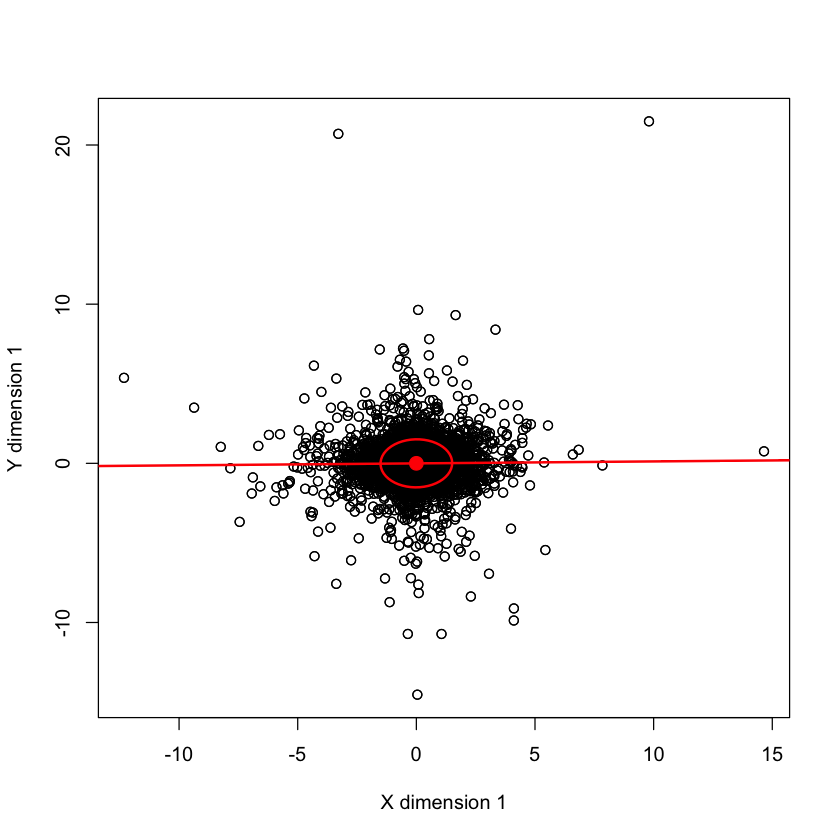

In [46]:
plot(cc)

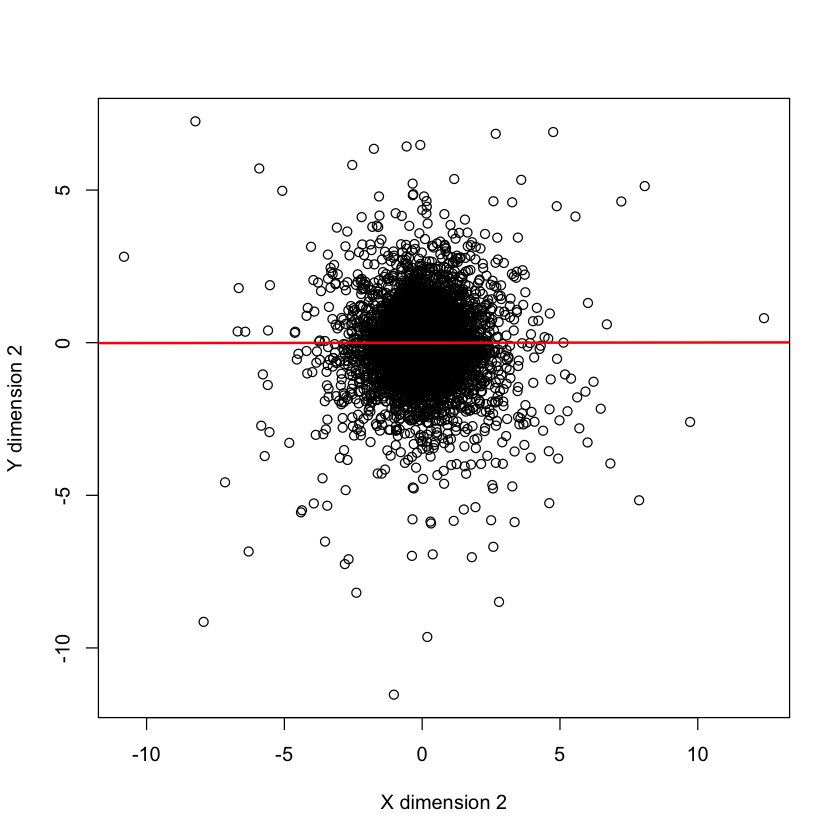

In [48]:
plot(as.matrix(data[part1]) %*% cc$coef$X[,'Xcan2'], as.matrix(data[part2]) %*% cc$coef$Y[,'Ycan2'],
    xlab = "X dimension 2", ylab = "Y dimension 2")
abline(lm(
    as.matrix(data[part1]) %*% cc$coef$X[,'Xcan2'] ~ as.matrix(data[part2]) %*% cc$coef$Y[,'Ycan2']
), col="red", lwd=2)

Вывод: линейной зависимости между выплатами не наблюдается.